<a href="https://colab.research.google.com/github/goktuggokmen/vocal-seperator/blob/main/DSP_Project_Vocal_Seperator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **<font color='red'>İZMİR DEMOKRASİ ÜNİVERSİTESİ</font>**
# **<font color='red'>MÜHENDİSLİK FAKÜLTESİ</font>**
# **<font color='red'>ELEKTRİK-ELEKTRONİK MÜHENDİSLİĞİ BÖLÜMÜ</font>**
# **<font color='black'>2020-2021 BAHAR DÖNEMİ </font>**
# **<font color='black'>EEM 306 SAYISAL SİNYAL İŞLEME DERSİ PROJESİ</font>**
# **<font color='black'>VOKAL AYIRMA</font>**

**Hazırlayan;**

**Ad-Soyad : <font color='black'>Göktuğ GÖKMEN</font>**

**Öğrenci No : <font color='black'>1806102007</font>**           

**<font color='silver'> Amaç : Vokal Ayırma” projesindeki temel amaç, bir müzik parçasındaki vokalleri kendisini takip eden eşlikten ayırmak, daha net şekilde ifade etmek gerekirse parçayı vokalden arındırmaktır.</font>**

**<font color='silver'> Hedef : Proje sonunda elde edilmesini beklediğimiz çıktı, müzik parçalarını girdi olarak alan bu parçalara çeşitli yöntemler uygulayarak vokal ve eşlik olarak iki parçaya bölen bu parçaları hem görsel olarak (STFT (Short-time Fourier Transform), Spektrogram vb.) hem de işitsel olarak bir çıktı haline getiren sistem tasarlamak.</font>**

In [ ]:
%matplotlib inline

In [ ]:
#öncelikle kütüphaneleri import ediyoruz.
from __future__ import print_function #python'un eski verisyonlarından fonksiyon çağırabilmemizi sağlayan bir kütüphane.
import numpy as np #numpy kütüphanesini min(),max(),mean() ve median() gibi fonksiyonları için kullanacağız.
import matplotlib.pyplot as plt #matplotlib kütüphanesini elde ettiğimiz ses verilerini görselleştirmek için kullanacağız.
import librosa #librosa kütüphanesi projemiz için belki de en önemli kütüphane,vokal ayrımı için kullanacağımız maskeleri oluşturup,sese uygularken bu kütüphaneden yararlanacağız.
import librosa.display #ses sinyallerini görselleştirebilmek için bu librosa eklentisinden yararlanacağız.
import IPython.display as ipd #girdi olarak seçtiğimiz müziği oynatmak için bu kütüphaneden yararlanacağız.
import soundfile as sf #ses dosyalarını okumak ve yazdırmak için kullanılan kütüphane.

In [ ]:
#vokalden arındıracağımız müziği seçiyoruz.
x = input("Vokalden Ayırmak İstediğiniz Müzik (Yolunu giriniz.):")
y, sr = librosa.load(x)
#spektrogramın büyüklük ve faz bileşenleri.
S_full, phase = librosa.magphase(librosa.stft(y)) #STFT; kısa, örtüşen pencereler üzerinde ayrık Fourier dönüşümlerini (DFT) hesaplayarak zaman-frekans alanında bir sinyali temsil eder.

Vokalden Ayırmak İstediğiniz Müzik (Yolunu giriniz.):/content/OrnekInput (The Raps Well).mp3


/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


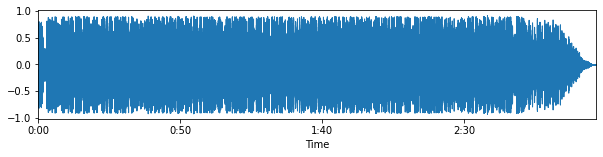

In [ ]:
#sinyalin görselleştirilmesi
plt.figure(figsize=(10,2)) 
librosa.display.waveplot(y,sr=sr)

In [ ]:
#yüklediğimiz sesin oynatılması
ipd.Audio(y,rate=sr) 

In [ ]:
#çıktılar için dosya oluşturuyoruz.
output_file_path_1 = "Output1_Eslik.wav" #eşlik bileşeni için oluşturulan çıktı dosyası.
output_file_path_2 = "Output2_Vokal.wav" #vokal bileşen için oluşturulan çıktı dosyası.

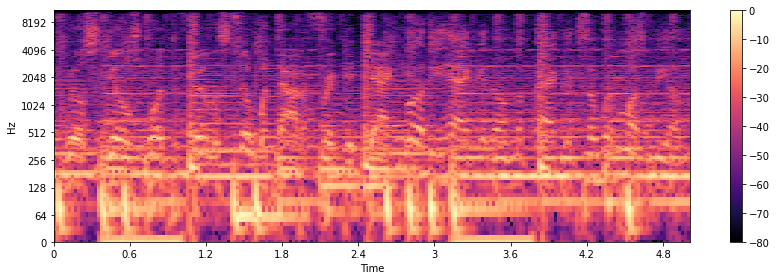

In [ ]:
#spektrumun 5 saniyelik bir dilimini çizdiriyoruz
idx = slice(*librosa.time_to_frames([30, 35], sr=sr))
plt.figure(figsize=(12, 4))
librosa.display.specshow(librosa.amplitude_to_db(S_full[:, idx], ref=np.max), y_axis='log', x_axis='time', sr=sr)
plt.colorbar()
plt.tight_layout()

<font color='silver'>Yukarıdaki kıvrımlı çizgiler vokal bileşenden kaynaklanmaktadır. Amacımız, onları eşlik eden enstrumantasyondan ayırmaktır.</font>





In [ ]:
#kosinüs benzerliğini kullanarak kareleri karşılaştıracağız ve benzer kareleri toplayacağız (frekans başına medyan değerini alarak).
S_filter = librosa.decompose.nn_filter(S_full, aggregate=np.median, metric='cosine', width=int(librosa.time_to_frames(2, sr=sr)))
#filtrenin çıkışı girişinden büyük olmamalı.
S_filter = np.minimum(S_full, S_filter)

<font color='silver'>Burada iki adet maske oluşturup sinyale uygulayacağız ve iki adet çıktı alacağız.Verdiğimiz giriş sinyali iki ayrı parçaya ayrılmış olacak (Vokal ve eşlik olarak.).</font>

<font color='silver'>Maskeleri oluşturduğumuzda onları giriş spektrumları ile çarpmamız yeterli.</font>


In [ ]:
#marginlerin (kenar boşluğu) belirlenmesi.
margin_1, margin_2 = 2, 10
power = 2

#maskelerin oluşturulması.
mask_1 = librosa.util.softmask(S_filter, margin_1 * (S_full - S_filter), power=power) #M = X**power / (X**power + X_ref**power) formulünü kullanıyor.
mask_2 = librosa.util.softmask(S_full - S_filter, margin_2 * S_filter, power=power)

#giriş spektrumunu maskelerle çarparak bileşenlerine ayırıyoruz.
S_background = mask_1 * S_full
S_foreground = mask_2 * S_full

<font color='silver'>Bileşenlerine ayırdığımız ses sinyalini sinyalin ilk haliyle karşılaştırmalı şekilde görselleştireceğiz.</font>




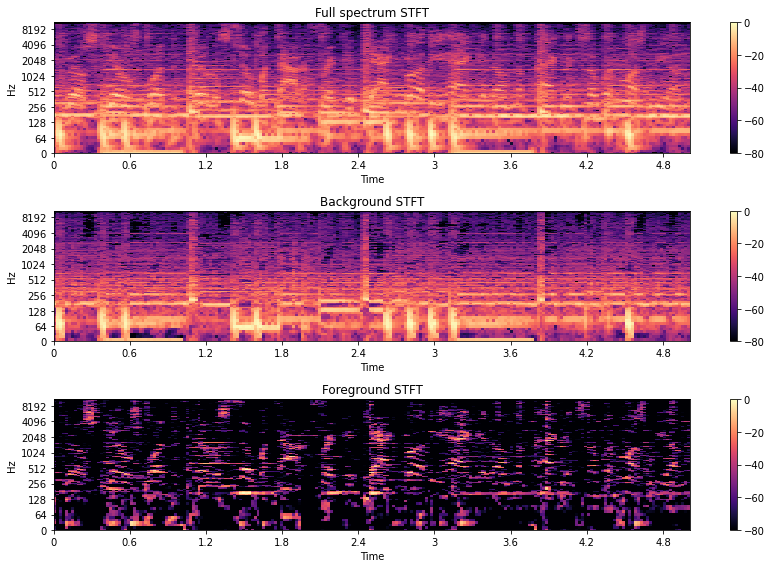

In [ ]:
plt.figure(figsize=(12, 8))

plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_full[:, idx], ref=np.max), y_axis='log', x_axis='time', sr=sr)
plt.title('Full spectrum STFT')
plt.colorbar()

plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_background[:, idx], ref=np.max), y_axis='log', x_axis='time', sr=sr)
plt.title('Background STFT')
plt.colorbar()

plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(S_foreground[:, idx], ref=np.max), y_axis='log', x_axis='time', sr=sr)
plt.title('Foreground STFT')
plt.colorbar()

plt.tight_layout()
plt.show()

In [ ]:
#defterin başlarında ayırdığımız büyüklük ve fazı maske uyguladığımız her iki bileşen  için de tekrardan birleştireceğiz (matematiksel çarpım uygulayarak).
#D (Spektrogram) = S (Magnitude) * P (Phase)
D_background = S_background * phase 
D_foreground = S_foreground * phase

#sinyali fourier transform uygulayarak frekans düzlemine geçirmiştik son adımda ise inverse (ters) fourier transform uygulayarak tekrardan zaman düzlemine geçiyoruz.
y_background = librosa.istft(D_background)
y_foreground = librosa.istft(D_foreground)

#elde edilen çıktıları, çıktılar için oluşturduğumuz dosyalara atıyoruz.
sf.write(output_file_path_1, y_background, samplerate=sr)
sf.write(output_file_path_2, y_foreground, samplerate=sr)

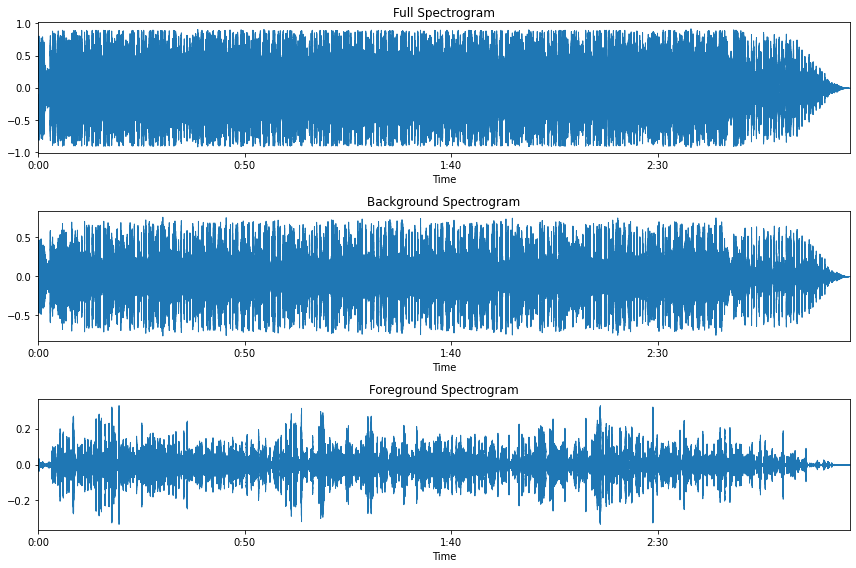

In [ ]:
plt.figure(figsize=(12, 8))

plt.subplot(3, 1, 1)
librosa.display.waveplot(y,sr=sr)
plt.title('Full Spectrogram')

plt.subplot(3, 1, 2)
librosa.display.waveplot(y_background,sr=sr)
plt.title('Background Spectrogram')

plt.subplot(3, 1, 3)
librosa.display.waveplot(y_foreground,sr=sr)
plt.title('Foreground Spectrogram')

plt.tight_layout()
plt.show()